# CoDA — v5 (30-seed metrics + analytic ground-truth + cfg block)
This notebook reproduces the v2 behavior (reliable splitting + deterministic transitions) and adds multi-seed metrics, latest merging logic, and analytic ground-truth maps.


In [12]:

import numpy as np
import matplotlib.pyplot as plt
from typing import List

from spatial_environments import GridEnvRightDownNoSelf, GridEnvRightDownNoCue
from util import generate_dataset, generate_dataset_post_augmentation


## Config (edit here)

In [13]:

# Global
N_SEEDS   = 30
SEED0     = 0
N_ACQ     = 250
N_EXT     = 300
MAX_STEPS = 20
CUE       = 5

# Extinction 'wash-in' (stronger forgetting for first episodes; no reset)
WASH_IN = 50
EDGE_EPS_EARLY = 1e-4
EDGE_EPS_LATE  = 1e-6

# Choose which seed to visualize for learned vs ground-truth maps
PLOT_SEED = 7


## CoDA agent (import) + single cfg block

In [14]:

from coda_trial_by_trial_util import CoDAAgent, CoDAConfig, normalize_transition_counts

# Split-friendly acquisition cfg (no decay); extinction wash-in overrides are applied programmatically
cfg = CoDAConfig(
    gamma=0.95, lam=0.90,
    theta_split=0.60, theta_merge=0.50,
    confidence=0.80,
    n_threshold=8,
    min_presence_episodes=3,
    min_effective_exposure=5.0,
    count_decay=0.9,   # v2-style: no decay in acquisition
    trace_decay=0.9,
    retro_decay=0.9
)


## Helpers: policy episode, absorbing terminals, analytic ground-truth (acq/ext)

In [15]:

def greedy_right_down_policy(env, s, acts):
    return 0 if 0 in acts else (1 if 1 in acts else np.random.choice(acts))

def run_episode_with_policy(env, policy_fn, max_steps=20):
    states, actions = [], []
    s = env.reset()
    for _ in range(max_steps):
        states.append(s)
        valid = env.get_valid_actions(s if s not in getattr(env, "clone_dict", {}) else env.clone_dict[s])
        if not valid: break
        a = policy_fn(env, s, valid)
        actions.append(a)
        s_next, r, done = env.step(a)
        s = s_next
        if done:
            states.append(s)
            break
    return states, actions

def absorb_terminals_in_learner(agent):
    for t in (agent.env.rewarded_terminals + agent.env.unrewarded_terminals):
        if t < agent.transition_counts.shape[0]:
            agent.transition_counts[t, :, :] = 0.0
    agent.transition_probs = normalize_transition_counts(agent.transition_counts)

# ---------- Analytic Ground-Truth ----------
# Build deterministic [S,A,S] from geometry (no clones)
def base_T_from_env(env):
    S = env.num_unique_states
    A = max(a for acts in env.valid_actions.values() for a in acts) + 1
    T = np.zeros((S, A, S), dtype=float)
    for s, acts in env.valid_actions.items():
        for a in acts:
            i,j = env.state_to_pos[s]
            di,dj = env.base_actions[a]
            ni,nj = i+di, j+dj
            sp = env.pos_to_state[(ni,nj)]
            T[s,a,sp] = 1.0
    # terminals absorbing
    for t in (env.rewarded_terminals + env.unrewarded_terminals):
        if t < S: T[t,:,:] = 0.0
    return T

# Acquisition GT: Markovian via cloning successors of cue state(s)
def gt_acquisition_with_clones(env, cue_states):
    T = base_T_from_env(env)
    S,A,_ = T.shape
    # clone each successor of each cue
    clone_map = {}  # successor -> clone_id
    for cue in cue_states:
        for a in env.get_valid_actions(cue):
            # find successor sp deterministically from geometry
            i,j = env.state_to_pos[cue]; di,dj = env.base_actions[a]; ni,nj = i+di, j+dj
            sp = env.pos_to_state[(ni,nj)]
            if sp in clone_map:  # already cloned for another action
                clone_id = clone_map[sp]
            else:
                clone_id = S; S += 1
                # grow T
                T = np.pad(T, ((0,1),(0,0),(0,1)), mode='constant')
                # clone inherits outgoing from parent successor
                T[clone_id, :, :T.shape[2]-1] = T[sp, :, :T.shape[2]-1]
                # terminals absorbing already 0
                clone_map[sp] = clone_id
            # re-route cue->sp to cue->clone_id
            mass = T[cue, a, sp]
            T[cue, a, sp] = 0.0
            T[cue, a, clone_id] = mass
    return T

# Extinction GT: no clones; any transition that would go into rewarded_terminal is redirected to corresponding unrewarded_terminal
def gt_extinction_no_clones(env2):
    T = base_T_from_env(env2)
    S,A,_ = T.shape
    # Redirect to unrewarded terminal deterministically
    for idx, rt in enumerate(env2.rewarded_terminals):
        if idx < len(env2.unrewarded_terminals):
            nt = env2.unrewarded_terminals[idx]
            # for all s,a: if T[s,a,rt]=1 -> move to nt instead
            mask = T[:,:,rt] > 0
            T[:,:,nt][mask] = T[:,:,rt][mask]
            T[:,:,rt][mask] = 0.0
    # terminals absorbing are already zero-outbound
    return T


## Metrics (KL/JS/Entropy/Markov) using analytic ground-truth refs

In [16]:

EPS = 1e-12

def _safe_row_norm(x, axis=-1, eps=EPS):
    y = x.astype(float, copy=True); s = y.sum(axis=axis, keepdims=True); s[s<eps] = 1.0; y /= s; return y

def _pad3(A, shape):
    S,A_,S2 = A.shape; Sg,Ag,S2g = shape
    out = np.zeros(shape, dtype=float)
    out[:min(S,Sg), :min(A_,Ag), :min(S2,S2g)] = A[:min(S,Sg), :min(A_,Ag), :min(S2,S2g)]
    return out

def _agg(T): return _safe_row_norm(T.sum(axis=1), axis=1)

def _kl(p,q,eps=EPS):
    p = np.clip(p,eps,1.0); p/=p.sum(); q = np.clip(q,eps,1.0); q/=q.sum(); return float(np.sum(p*(np.log(p)-np.log(q))))

def _js(p,q,eps=EPS):
    p = np.clip(p,eps,1.0); p/=p.sum(); q = np.clip(q,eps,1.0); q/=q.sum(); m = 0.5*(p+q); 
    return 0.5*_kl(p,m,eps)+0.5*_kl(q,m,eps)

def _H(p,eps=EPS): p=np.clip(p,eps,1.0); p/=p.sum(); return float(-np.sum(p*np.log(p)))

def kl_over_time_fixed(T_series, T_ref_fixed, use_js=False):
    scores = []
    for T in T_series:
        shape = tuple(max(x,y) for x,y in zip(T.shape, T_ref_fixed.shape))
        P,Q = _agg(_pad3(T,shape)), _agg(_pad3(T_ref_fixed,shape))
        rows = P.shape[0]; vec = [_js(P[i],Q[i]) if use_js else _kl(P[i],Q[i]) for i in range(rows)]
        scores.append(float(np.mean(vec)))
    return np.array(scores)

def entropy_over_time(T_series):
    out = []
    for T in T_series:
        P = _agg(T); out.append(float(np.mean([_H(P[i]) for i in range(P.shape[0])])))
    return np.array(out)

def markovization_score(T):
    P = _agg(T); H = np.array([_H(P[i]) for i in range(P.shape[0])]); Hmax = np.log(max(2,P.shape[1]))
    return float(1.0 - np.mean(H)/Hmax)


## Single-seed run (uses `cfg`; v2 behavior restored for acquisition)

In [17]:

def run_one_seed(seed:int, cfg:CoDAConfig):
    np.random.seed(seed)

    # Acquisition env & agent
    env = GridEnvRightDownNoSelf(cue_states=[CUE], env_size=(4,4), rewarded_terminal=[15])
    agent = CoDAAgent(env, cfg)

    T_series_acq: List[np.ndarray] = []
    with_clones = False
    first_split_seen = False

    for ep in range(1, N_ACQ+1):
        if first_split_seen:
            states, actions = run_episode_with_policy(env, greedy_right_down_policy, max_steps=MAX_STEPS)
        else:
            if with_clones:
                (states, actions) = generate_dataset_post_augmentation(env, agent.get_T(), n_episodes=1, max_steps=MAX_STEPS)[0]
            else:
                (states, actions) = generate_dataset(env, n_episodes=1, max_steps=MAX_STEPS)[0]

        agent.update_with_episode(states, actions)
        absorb_terminals_in_learner(agent)  # keep endpoints clean

        new = agent.maybe_split()
        if new:
            with_clones = True
            first_split_seen = True

        T_series_acq.append(agent.get_T().copy())

    # Extinction env (no reset; wash-in schedule)
    env2 = GridEnvRightDownNoCue(cue_states=[CUE], env_size=(4,4), rewarded_terminal=[15])
    env2.clone_dict = dict(getattr(env, "clone_dict", {}))
    env2.reverse_clone_dict = dict(getattr(env, "reverse_clone_dict", {}))
    agent.env = env2

    # Wash-in overrides
    orig = dict(count_decay=agent.cfg.count_decay, trace_decay=agent.cfg.trace_decay, retro_decay=agent.cfg.retro_decay,
                theta_merge=agent.cfg.theta_merge, confidence=agent.cfg.confidence,
                min_presence_episodes=agent.cfg.min_presence_episodes, min_effective_exposure=agent.cfg.min_effective_exposure)
    agent.cfg.count_decay=0.98; agent.cfg.trace_decay=0.98; agent.cfg.retro_decay=0.98
    agent.cfg.theta_merge=0.60; agent.cfg.confidence=0.99
    agent.cfg.min_presence_episodes += 3; agent.cfg.min_effective_exposure = int(agent.cfg.min_effective_exposure*1.5)

    T_series_ext: List[np.ndarray] = []
    for k, ep in enumerate(range(N_ACQ+1, N_ACQ+N_EXT+1)):
        (states, actions) = generate_dataset_post_augmentation(env2, agent.get_T(), n_episodes=1, max_steps=MAX_STEPS)[0]
        agent.update_with_episode(states, actions)
        agent._edge_eps_override = EDGE_EPS_EARLY if k < WASH_IN else EDGE_EPS_LATE
        agent.maybe_merge()
        T_series_ext.append(agent.get_T().copy())

        if k == WASH_IN-1:
            agent.cfg.count_decay = orig["count_decay"]; agent.cfg.trace_decay = orig["trace_decay"]; agent.cfg.retro_decay = orig["retro_decay"]
            agent.cfg.theta_merge = orig["theta_merge"]; agent.cfg.confidence = orig["confidence"]
            agent.cfg.min_presence_episodes = orig["min_presence_episodes"]; agent.cfg.min_effective_exposure = orig["min_effective_exposure"]

    # --- Analytic fixed references ---
    T_ref_acq_fixed = gt_acquisition_with_clones(env, cue_states=[CUE])
    T_ref_ext_fixed = gt_extinction_no_clones(env2)

    # Metrics
    KL_acq = kl_over_time_fixed(T_series_acq, T_ref_acq_fixed, use_js=False)
    JS_acq = kl_over_time_fixed(T_series_acq, T_ref_acq_fixed, use_js=True)
    H_acq  = entropy_over_time(T_series_acq)
    MS_acq = np.array([markovization_score(T) for T in T_series_acq])

    KL_ext = kl_over_time_fixed(T_series_ext, T_ref_ext_fixed, use_js=False)
    JS_ext = kl_over_time_fixed(T_series_ext, T_ref_ext_fixed, use_js=True)
    H_ext  = entropy_over_time(T_series_ext)
    MS_ext = np.array([markovization_score(T) for T in T_series_ext])

    return dict(env_acq=env, env_ext=env2,
                T_series_acq=T_series_acq, T_series_ext=T_series_ext,
                T_ref_acq_fixed=T_ref_acq_fixed, T_ref_ext_fixed=T_ref_ext_fixed,
                KL_acq=KL_acq, JS_acq=JS_acq, H_acq=H_acq, MS_acq=MS_acq,
                KL_ext=KL_ext, JS_ext=JS_ext, H_ext=H_ext, MS_ext=MS_ext)


## Run 30 seeds and plot mean±SE bands

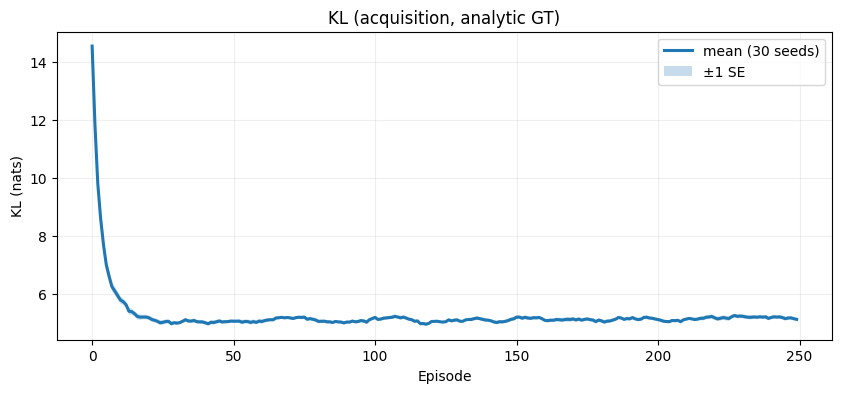

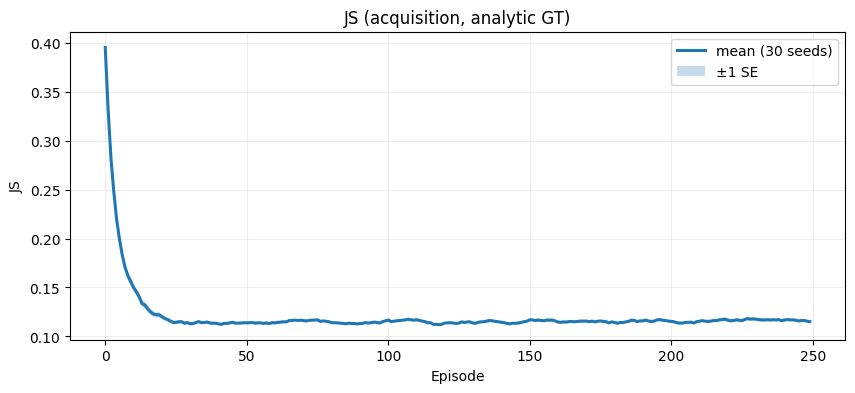

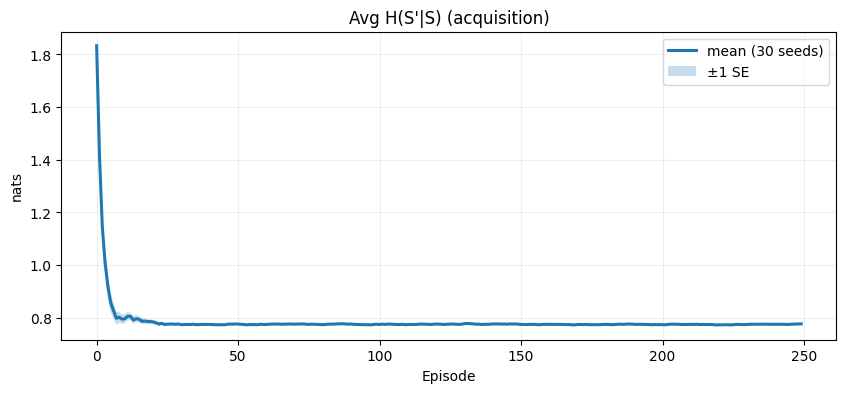

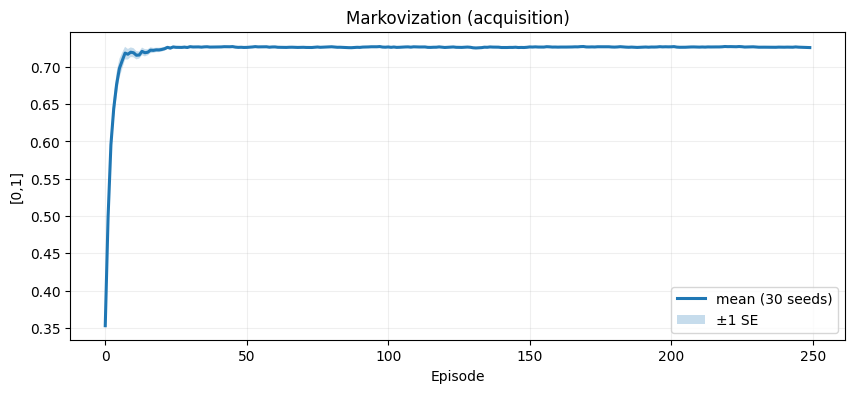

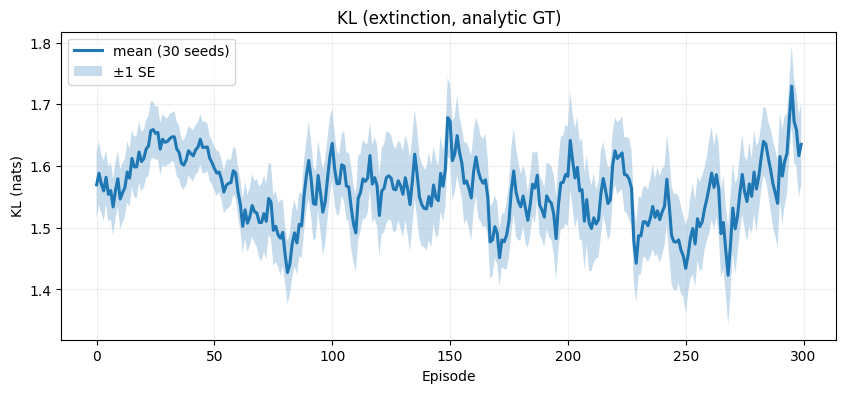

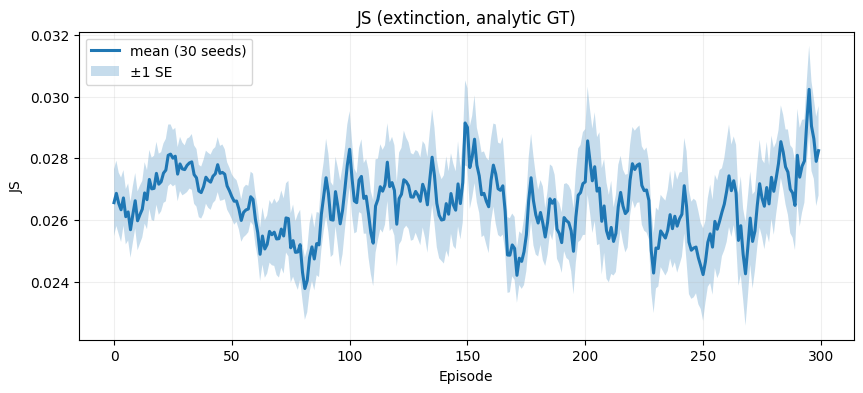

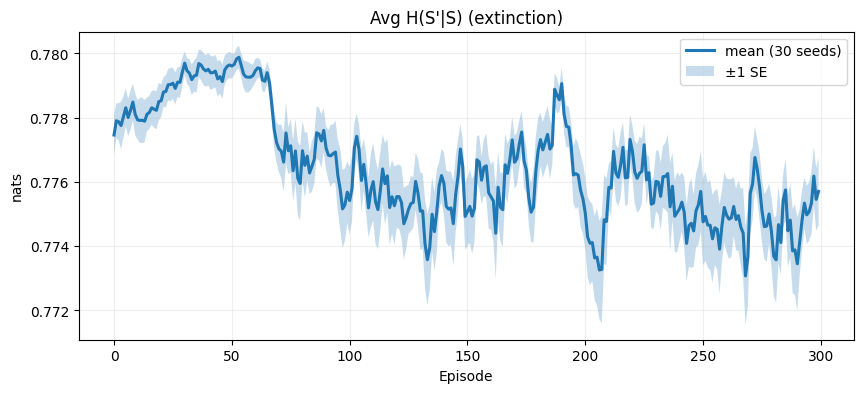

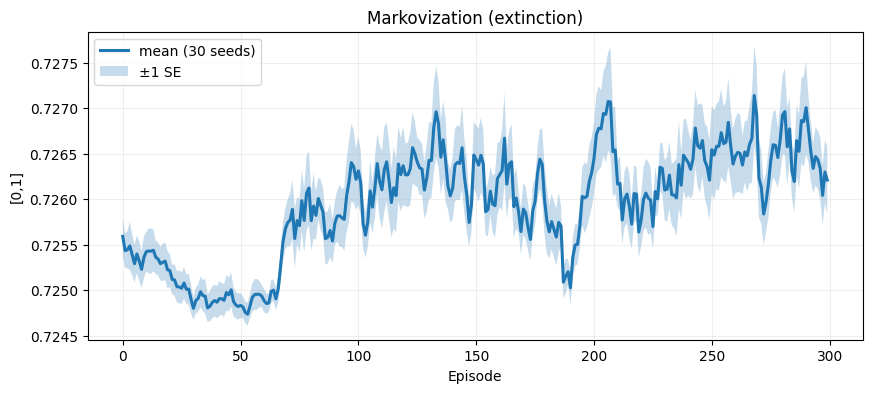

In [18]:

results = [run_one_seed(SEED0 + k, cfg) for k in range(N_SEEDS)]

KL_acq_runs = [r["KL_acq"] for r in results]
JS_acq_runs = [r["JS_acq"] for r in results]
H_acq_runs  = [r["H_acq"]  for r in results]
MS_acq_runs = [r["MS_acq"] for r in results]

KL_ext_runs = [r["KL_ext"] for r in results]
JS_ext_runs = [r["JS_ext"] for r in results]
H_ext_runs  = [r["H_ext"]  for r in results]
MS_ext_runs = [r["MS_ext"] for r in results]

def mean_se(arrs):
    L = max(len(a) for a in arrs); M = np.full((len(arrs), L), np.nan)
    for i,a in enumerate(arrs): M[i,:len(a)] = a
    mean = np.nanmean(M, axis=0); se = np.nanstd(M, axis=0, ddof=max(1, min(len(arrs)-1,1))) / np.sqrt(max(1,len(arrs)))
    return mean, se

def plot_band(y_runs, title, ylabel):
    mean, se = mean_se(y_runs); x = np.arange(len(mean))
    plt.figure(figsize=(10,4)); plt.plot(x, mean, lw=2.2, label=f"mean ({len(y_runs)} seeds)")
    plt.fill_between(x, mean-se, mean+se, alpha=0.25, label="±1 SE")
    plt.title(title); plt.xlabel("Episode"); plt.ylabel(ylabel); plt.legend(); plt.grid(alpha=0.2); plt.show()

# Acquisition
plot_band(KL_acq_runs, "KL (acquisition, analytic GT)", "KL (nats)")
plot_band(JS_acq_runs, "JS (acquisition, analytic GT)", "JS")
plot_band(H_acq_runs,  "Avg H(S'|S) (acquisition)", "nats")
plot_band(MS_acq_runs, "Markovization (acquisition)", "[0,1]")

# Extinction
plot_band(KL_ext_runs, "KL (extinction, analytic GT)", "KL (nats)")
plot_band(JS_ext_runs, "JS (extinction, analytic GT)", "JS")
plot_band(H_ext_runs,  "Avg H(S'|S) (extinction)", "nats")
plot_band(MS_ext_runs, "Markovization (extinction)", "[0,1]")


## Final learned vs analytic ground-truth (arrows included)

Seed 7 — final learned (acquisition)


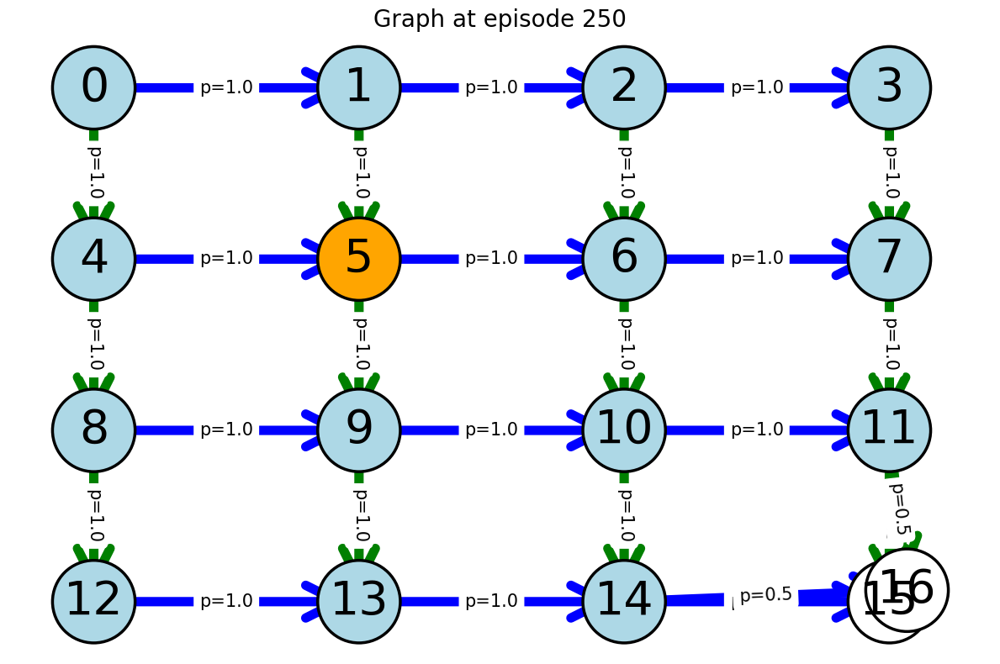

Ground-truth (acquisition; Markovian with clones)


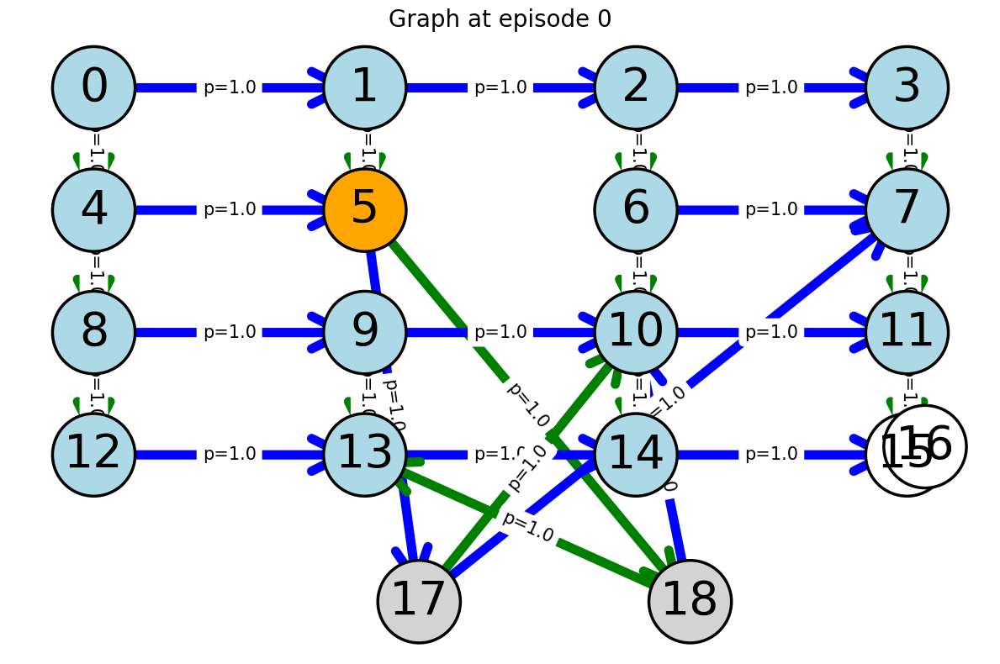

Seed 7 — final learned (extinction)


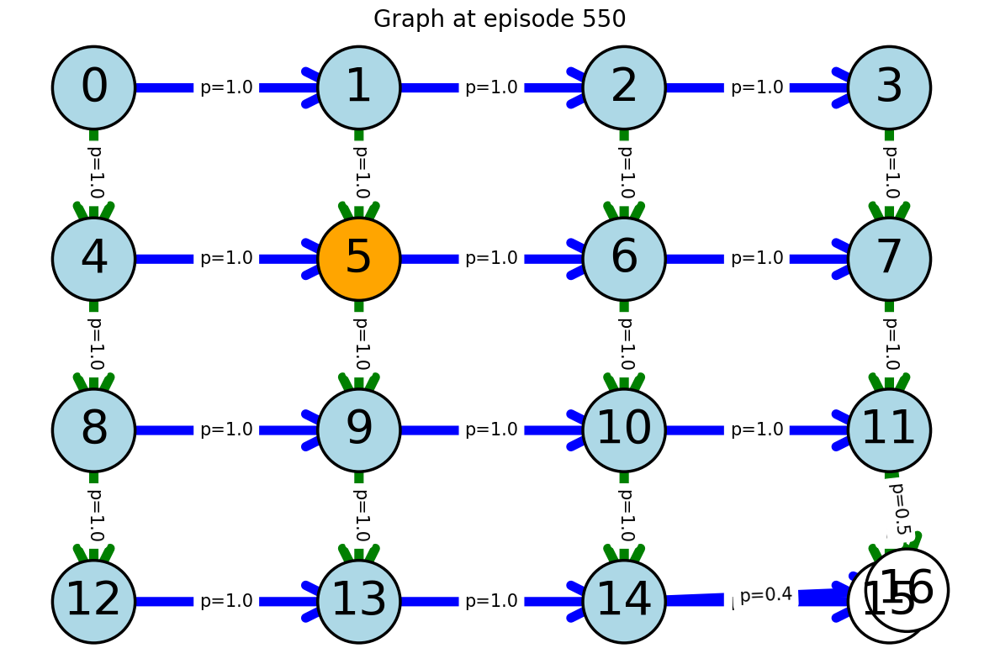

Ground-truth (extinction; no clones, deterministic to NR)


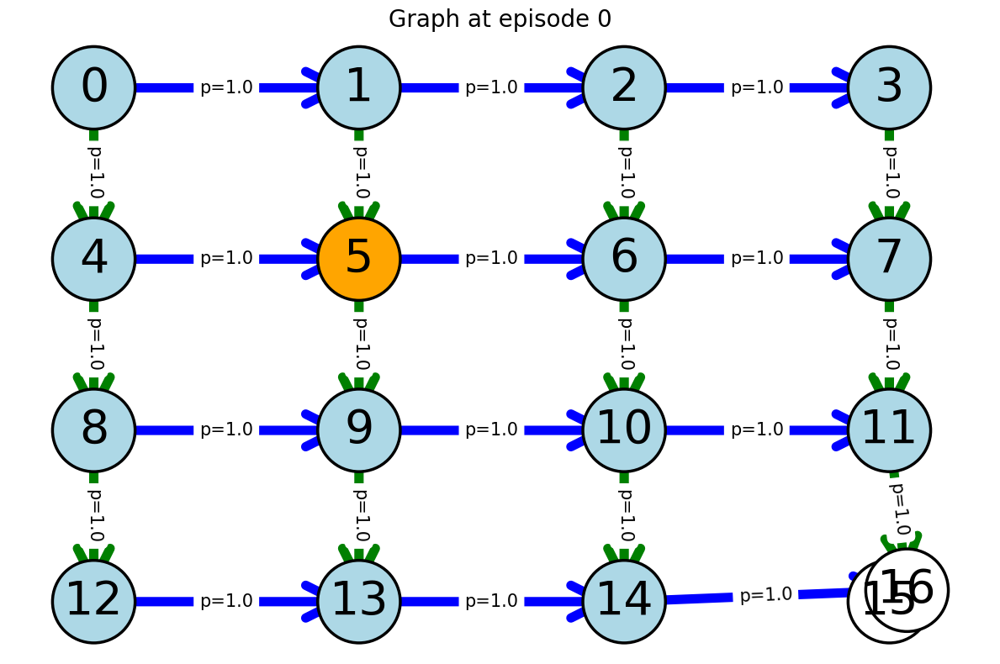

In [19]:

# pick the run matching PLOT_SEED
idx = PLOT_SEED - SEED0 if SEED0 <= PLOT_SEED < SEED0 + N_SEEDS else 0
env_acq = results[idx]["env_acq"]; env_ext = results[idx]["env_ext"]
T_acq_final = results[idx]["T_series_acq"][-1].copy()
T_ext_final = results[idx]["T_series_ext"][-1].copy()
T_ref_acq_fixed = results[idx]["T_ref_acq_fixed"]
T_ref_ext_fixed = results[idx]["T_ref_ext_fixed"]

def make_terminals_absorbing_for_plot(T, terminals):
    T = T.copy()
    for t in terminals:
        if t < T.shape[0]:
            T[t, :, :] = 0.0
    return T

def _pad3(A, shape):
    S,A_,S2 = A.shape; Sg,Ag,S2g = shape
    out = np.zeros(shape, dtype=float)
    out[:min(S,Sg), :min(A_,Ag), :min(S2,S2g)] = A[:min(S,Sg), :min(A_,Ag), :min(S2,S2g)]
    return out

# Align shapes and ensure arrows show (deterministic edges -> prob=1.0)
shape1 = tuple(max(x,y) for x,y in zip(T_acq_final.shape, T_ref_acq_fixed.shape))
shape2 = tuple(max(x,y) for x,y in zip(T_ext_final.shape, T_ref_ext_fixed.shape))

T_acq_vis     = make_terminals_absorbing_for_plot(_pad3(T_acq_final, shape1), env_acq.rewarded_terminals + env_acq.unrewarded_terminals)
T_acq_gt_vis  = make_terminals_absorbing_for_plot(_pad3(T_ref_acq_fixed, shape1), env_acq.rewarded_terminals + env_acq.unrewarded_terminals)
T_ext_vis     = make_terminals_absorbing_for_plot(_pad3(T_ext_final, shape2), env_ext.rewarded_terminals + env_ext.unrewarded_terminals)
T_ext_gt_vis  = make_terminals_absorbing_for_plot(_pad3(T_ref_ext_fixed, shape2), env_ext.rewarded_terminals + env_ext.unrewarded_terminals)

# Clean clone artifacts for the figure
def sanitize_for_plot(env, T, eps=1e-12):
    if T is None or getattr(T, "ndim", 0) != 3: return
    S = T.shape[0]; out_mass = T.sum(axis=(1,2)); in_mass  = T.sum(axis=(0,1))
    active = (out_mass + in_mass) > eps
    for cl in list(getattr(env, "clone_dict", {}).keys()):
        if cl >= S or not active[cl]:
            env.clone_dict.pop(cl, None)
    env.reverse_clone_dict = {parent: cl for cl, parent in env.clone_dict.items()}

sanitize_for_plot(env_acq, T_acq_vis)
sanitize_for_plot(env_ext, T_ext_vis)

THRESH = 0.30
print(f"Seed {PLOT_SEED} — final learned (acquisition)")
env_acq.plot_graph(T_acq_vis, niter=N_ACQ, threshold=THRESH, save=False, savename=f"seed{PLOT_SEED}_acq_learned.png")
print("Ground-truth (acquisition; Markovian with clones)")
env_acq.plot_graph(T_acq_gt_vis, niter=0, threshold=THRESH, save=False, savename=f"seed{PLOT_SEED}_acq_groundtruth.png")

print(f"Seed {PLOT_SEED} — final learned (extinction)")
env_ext.plot_graph(T_ext_vis, niter=N_ACQ+N_EXT, threshold=THRESH, save=False, savename=f"seed{PLOT_SEED}_ext_learned.png")
print("Ground-truth (extinction; no clones, deterministic to NR)")
env_ext.plot_graph(T_ext_gt_vis, niter=0, threshold=THRESH, save=False, savename=f"seed{PLOT_SEED}_ext_groundtruth.png")


## Change-aware graph snapshots (only when structure changes)

In [20]:

# Helpers to detect structural changes and sanitize clones for figures
THRESH = 0.30  # keep consistent with plot_graph threshold

def make_terminals_absorbing_for_plot(T, terminals):
    T = T.copy()
    for t in terminals:
        if t < T.shape[0]:
            T[t, :, :] = 0.0
    return T

def sanitize_for_plot(env, T, eps=1e-12):
    if T is None or getattr(T, "ndim", 0) != 3: return
    S = T.shape[0]
    out_mass = T.sum(axis=(1, 2)); in_mass  = T.sum(axis=(0, 1))
    active = (out_mass + in_mass) > eps
    for cl in list(getattr(env, "clone_dict", {}).keys()):
        if cl >= S or not active[cl]:
            env.clone_dict.pop(cl, None)
    env.reverse_clone_dict = {parent: cl for cl, parent in env.clone_dict.items()}

def thresh_adj(T, thr=THRESH):
    A = T.sum(axis=1)  # [S,S]
    return (A >= thr).astype(np.uint8)

def clone_dict_tuple(d):
    return tuple(sorted(d.items())) if isinstance(d, dict) else tuple()

def graph_changed(prev_T, prev_map, curr_T, curr_map, thr=THRESH):
    if curr_T is None:
        return False
    if prev_T is None:
        return True
    if prev_T.shape != curr_T.shape:
        return True
    A_prev = thresh_adj(prev_T, thr)
    A_curr = thresh_adj(curr_T, thr)
    if A_prev.shape != A_curr.shape:
        return True
    if (A_prev != A_curr).any():
        return True
    return prev_map != curr_map


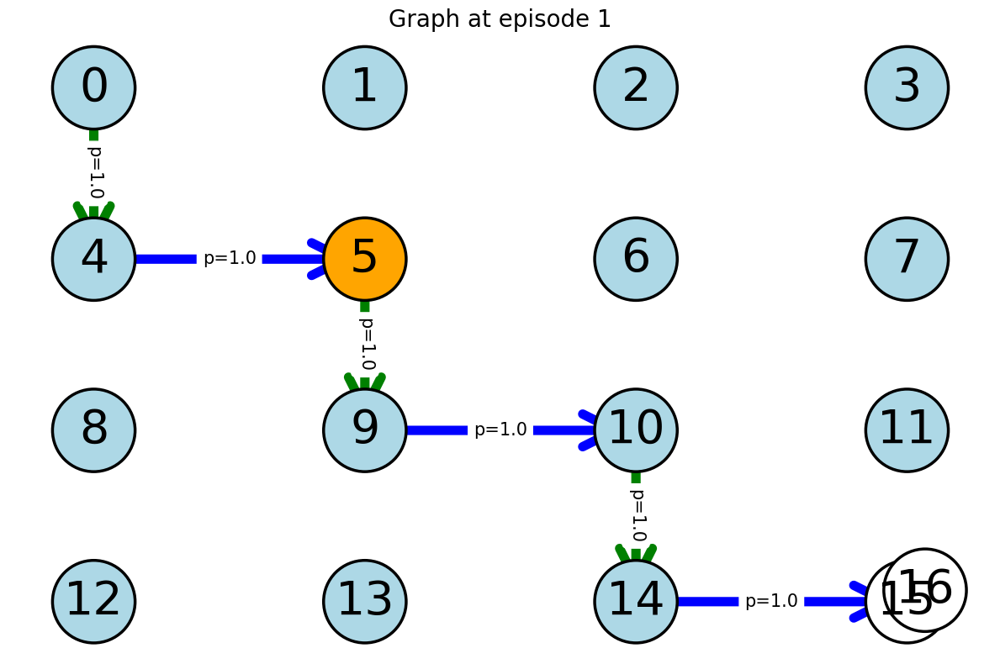

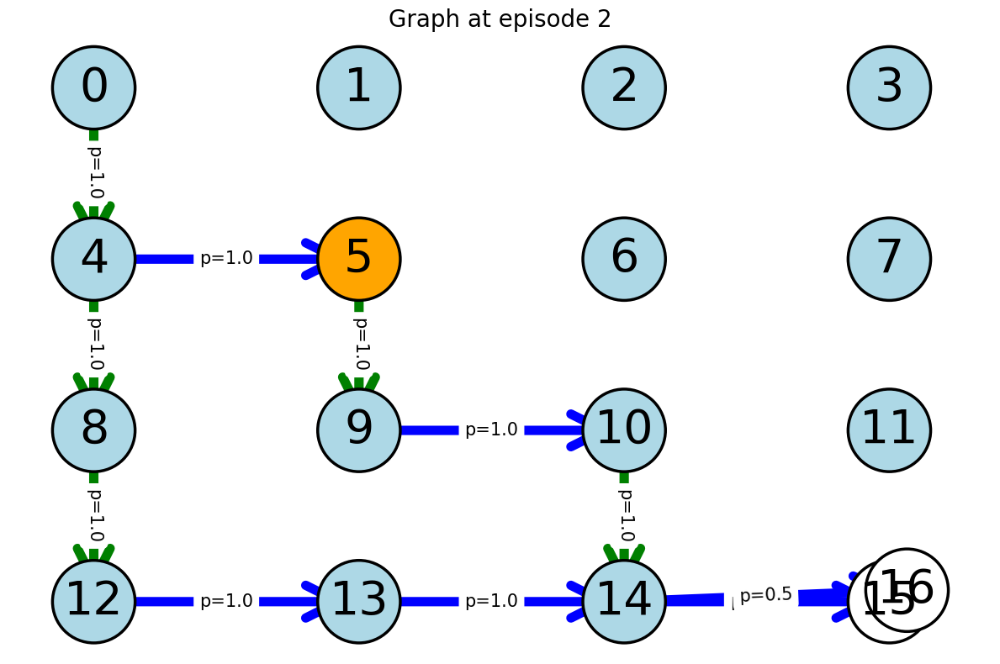

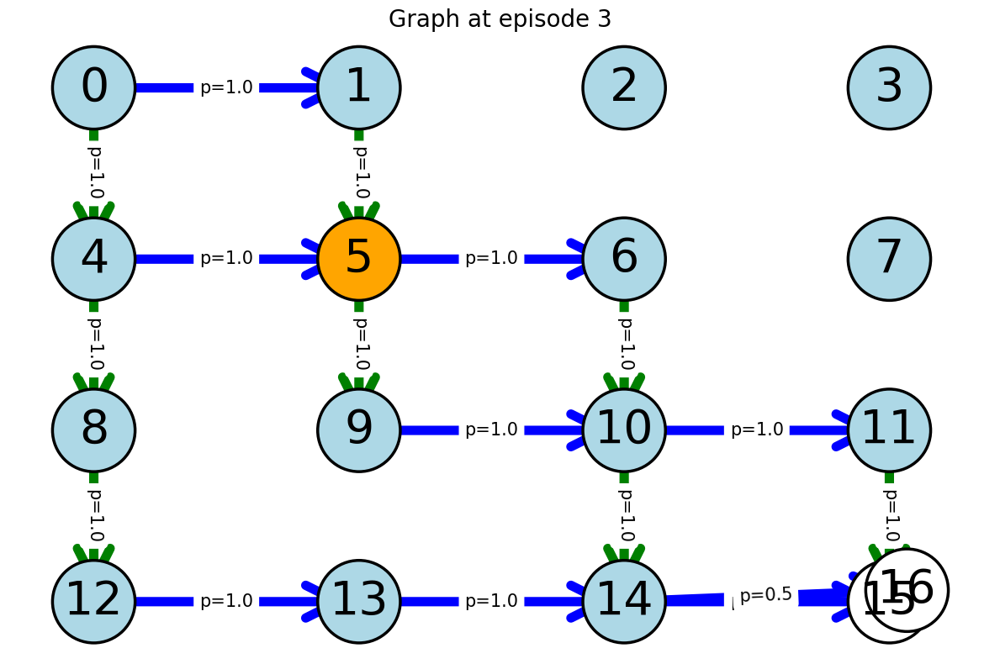

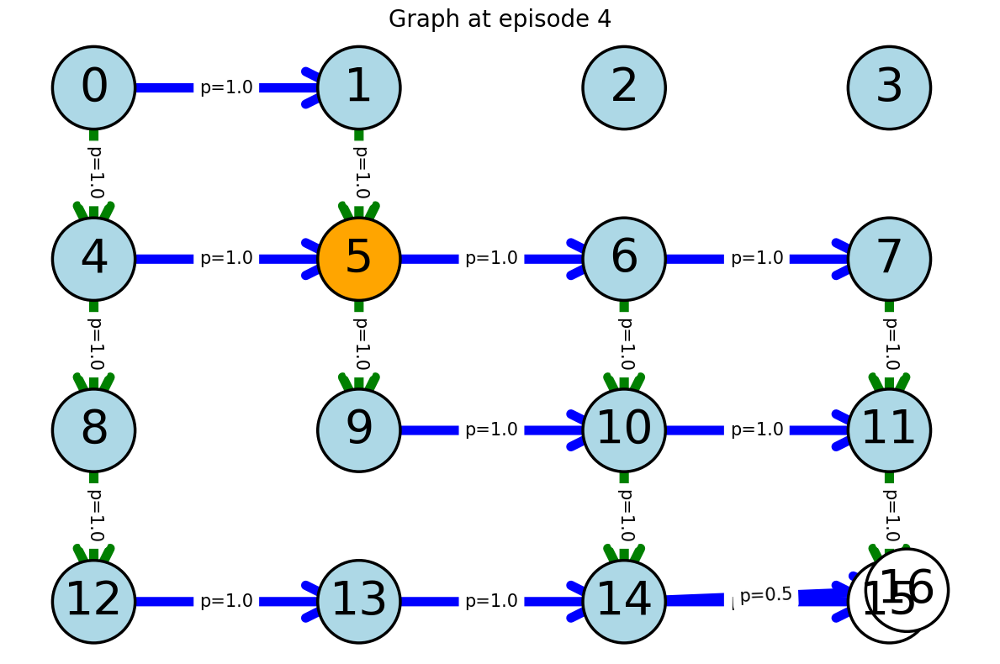

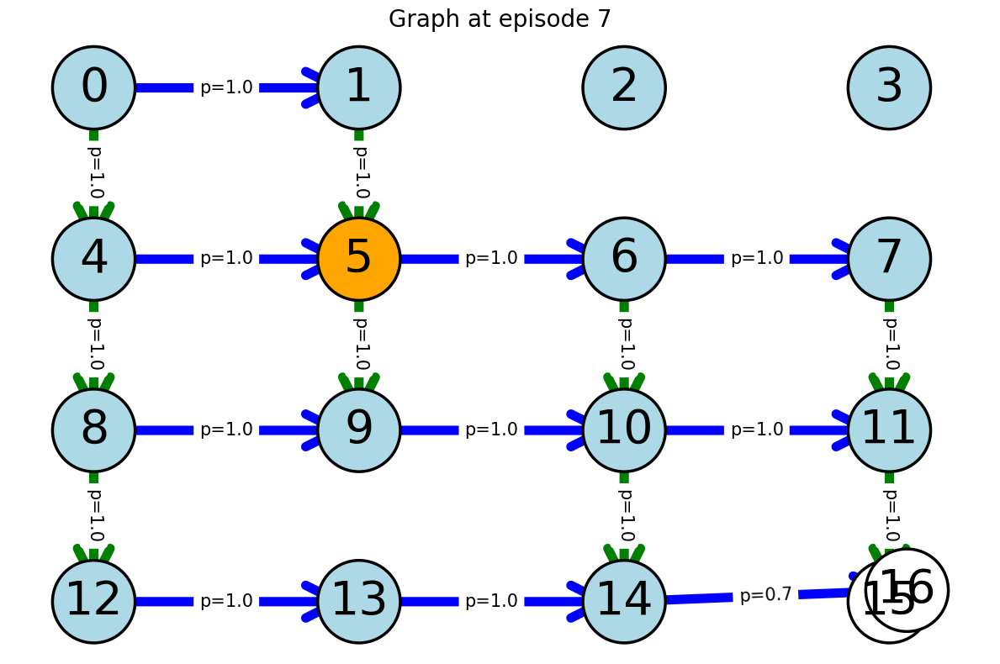

...

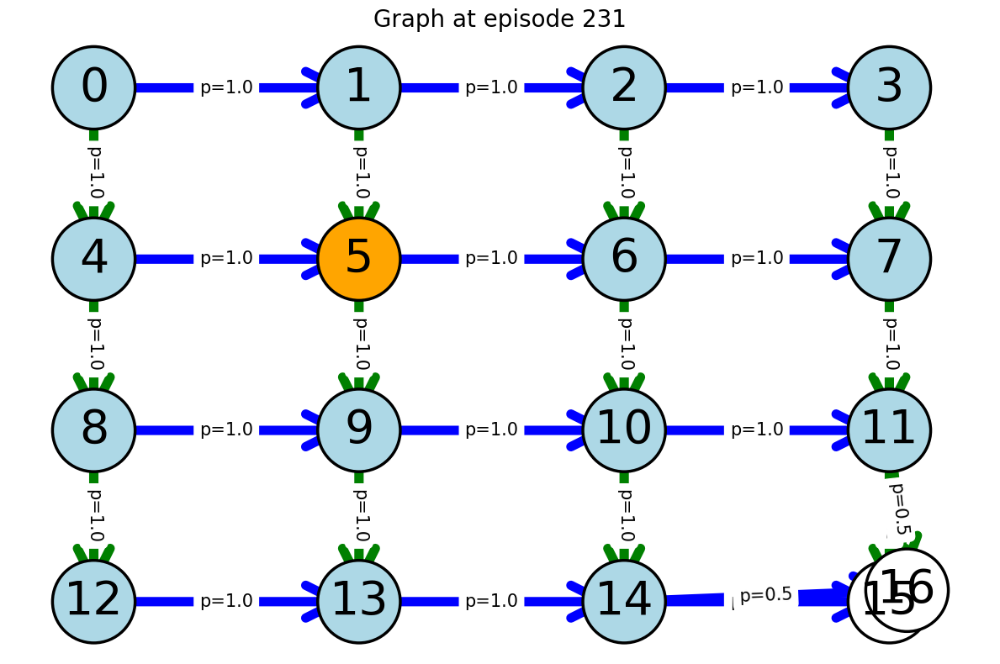

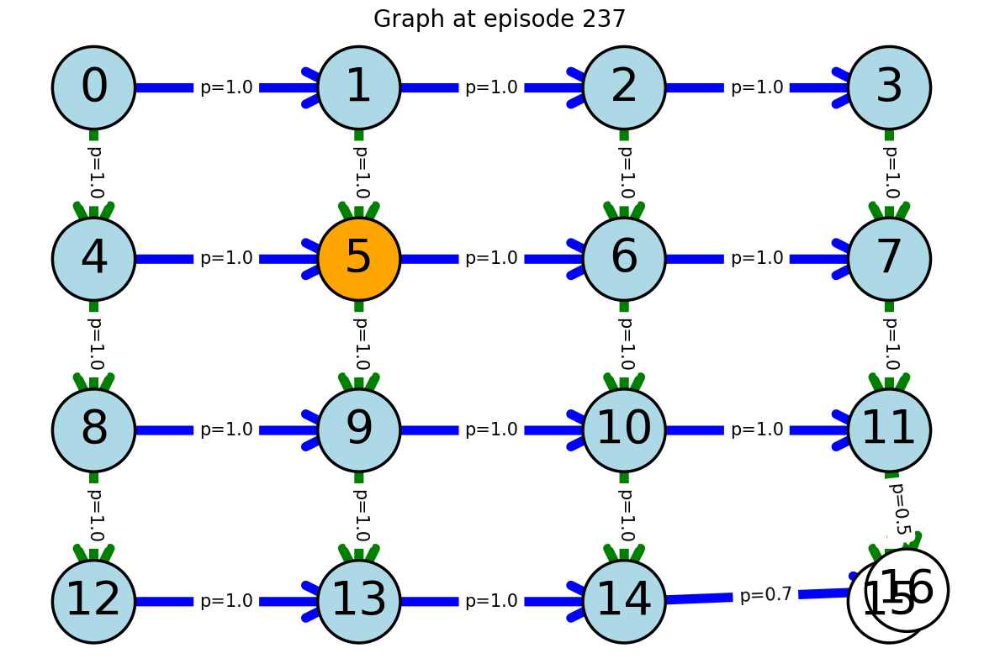

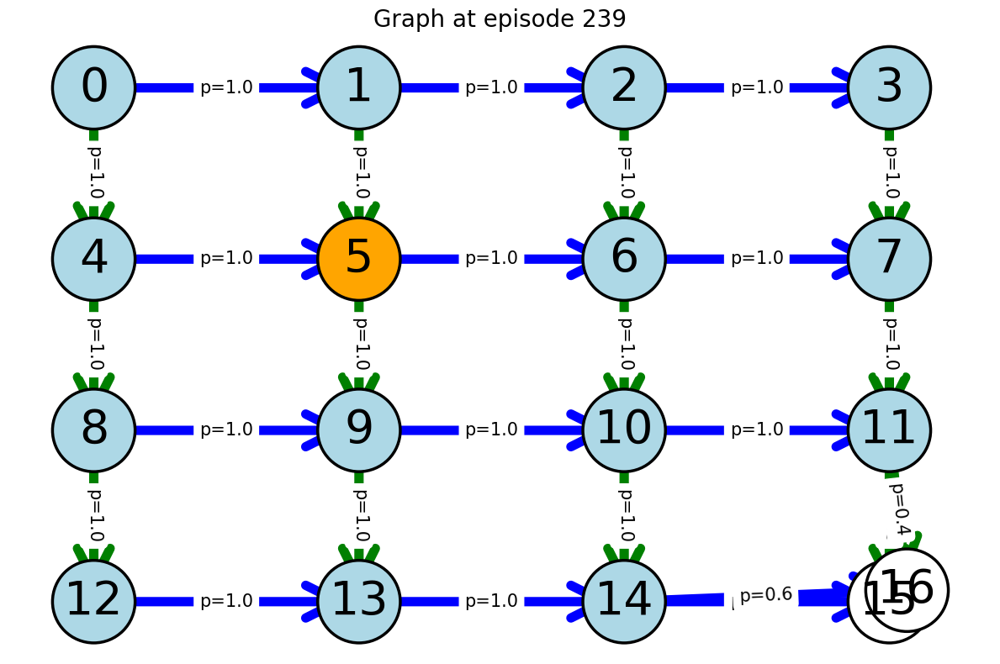

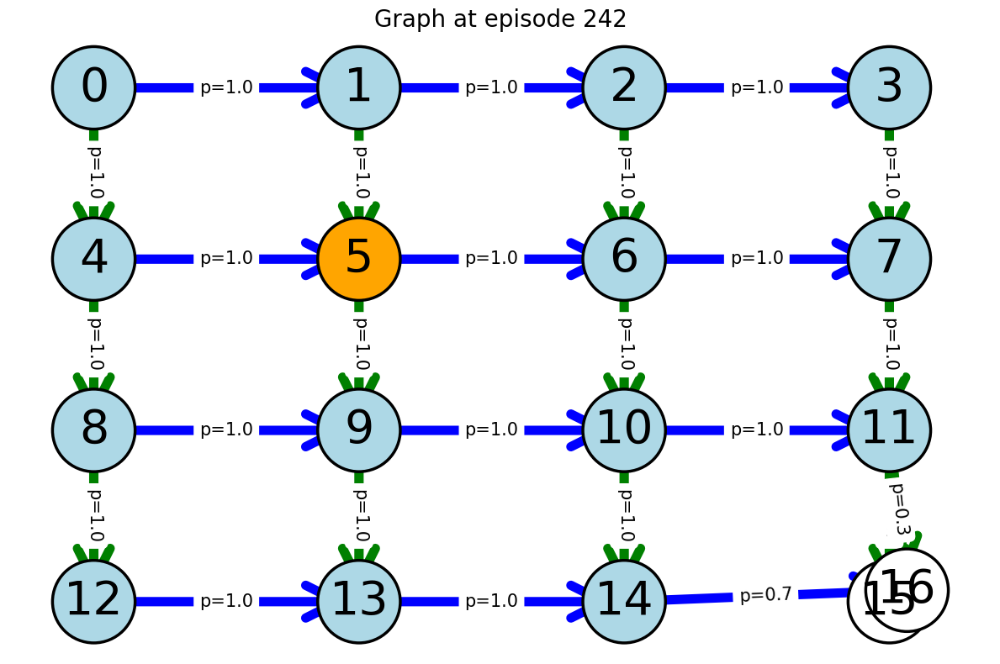

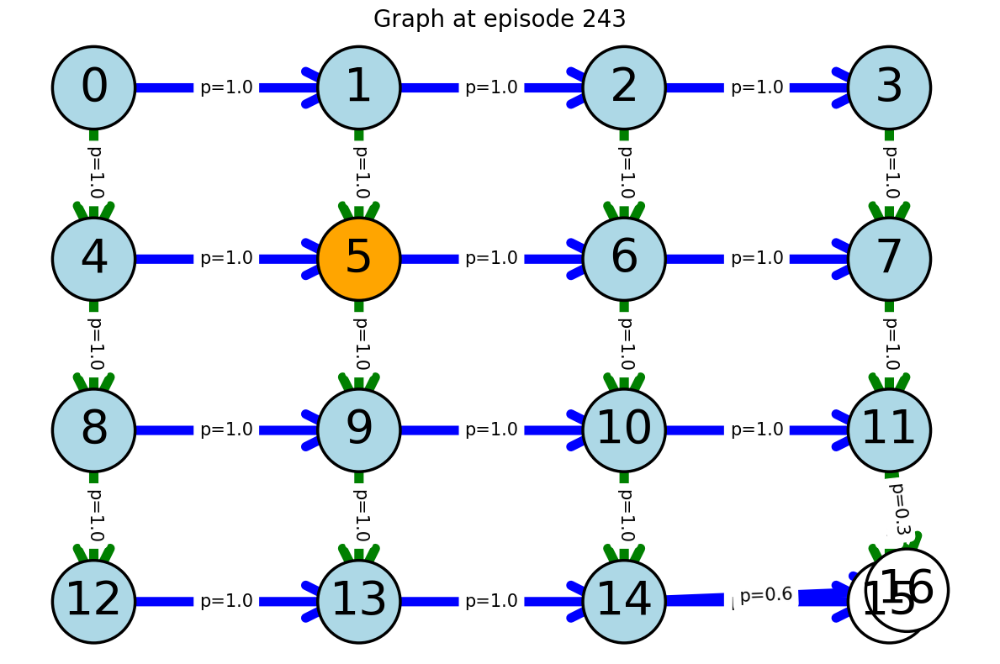

Saved acquisition snapshots at episodes: [1, 2, 3, 4, 7, 8, 9, 12, 13, 14, 16, 18, 20, 26, 27, 30, 35, 49, 52, 59] ... total: 67


In [21]:

# Re-run a single seed (PLOT_SEED) with change-aware snapshots for acquisition & extinction.
# Uses the same cfg and wash-in schedule as earlier cells.

np.random.seed(PLOT_SEED)

# Acquisition env & agent
env_snap = GridEnvRightDownNoSelf(cue_states=[CUE], env_size=(4,4), rewarded_terminal=[15])
agent_snap = CoDAAgent(env_snap, cfg)

changed_acq = []
prev_T = None; prev_map = None
with_clones = False; first_split_seen = False

for ep in range(1, N_ACQ+1):
    if first_split_seen:
        states, actions = run_episode_with_policy(env_snap, greedy_right_down_policy, max_steps=MAX_STEPS)
    else:
        if with_clones:
            (states, actions) = generate_dataset_post_augmentation(env_snap, agent_snap.get_T(), n_episodes=1, max_steps=MAX_STEPS)[0]
        else:
            (states, actions) = generate_dataset(env_snap, n_episodes=1, max_steps=MAX_STEPS)[0]

    agent_snap.update_with_episode(states, actions)
    absorb_terminals_in_learner(agent_snap)

    if agent_snap.maybe_split():
        with_clones = True; first_split_seen = True

    T_curr = agent_snap.get_T().copy()
    map_curr = clone_dict_tuple(getattr(env_snap, "clone_dict", {}))

    if graph_changed(prev_T, prev_map, T_curr, map_curr, thr=THRESH):
        T_vis = make_terminals_absorbing_for_plot(T_curr, env_snap.rewarded_terminals + env_snap.unrewarded_terminals)
        sanitize_for_plot(env_snap, T_vis)
        env_snap.plot_graph(T_vis, niter=ep, threshold=THRESH, save=True, savename=f"acq_seed{PLOT_SEED}_ep{ep}.png")
        changed_acq.append(ep)
        prev_T, prev_map = T_curr, map_curr

print("Saved acquisition snapshots at episodes:", changed_acq[:20], "... total:", len(changed_acq))


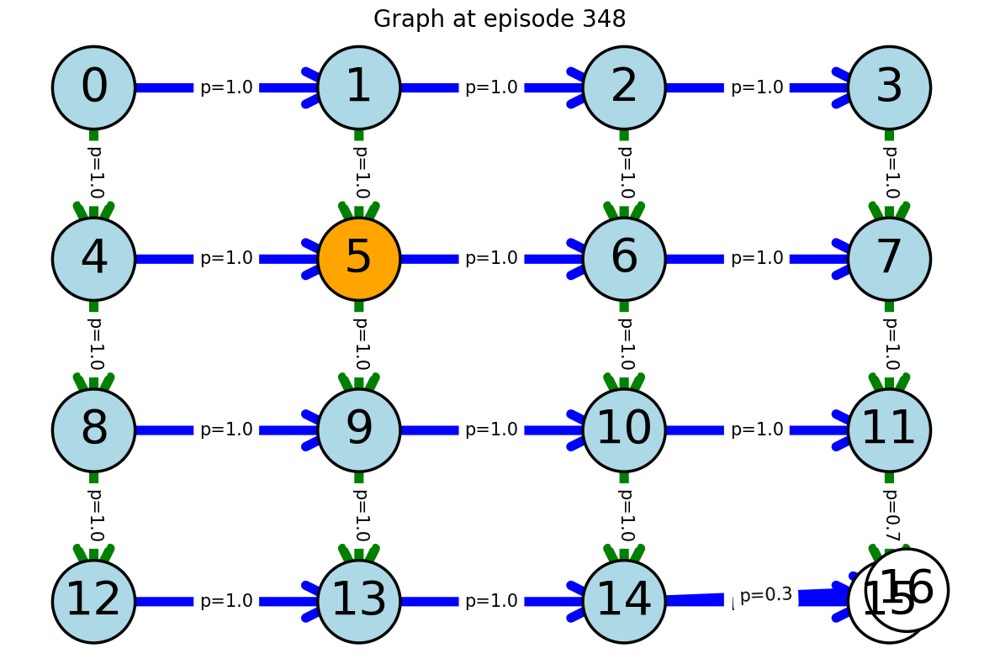

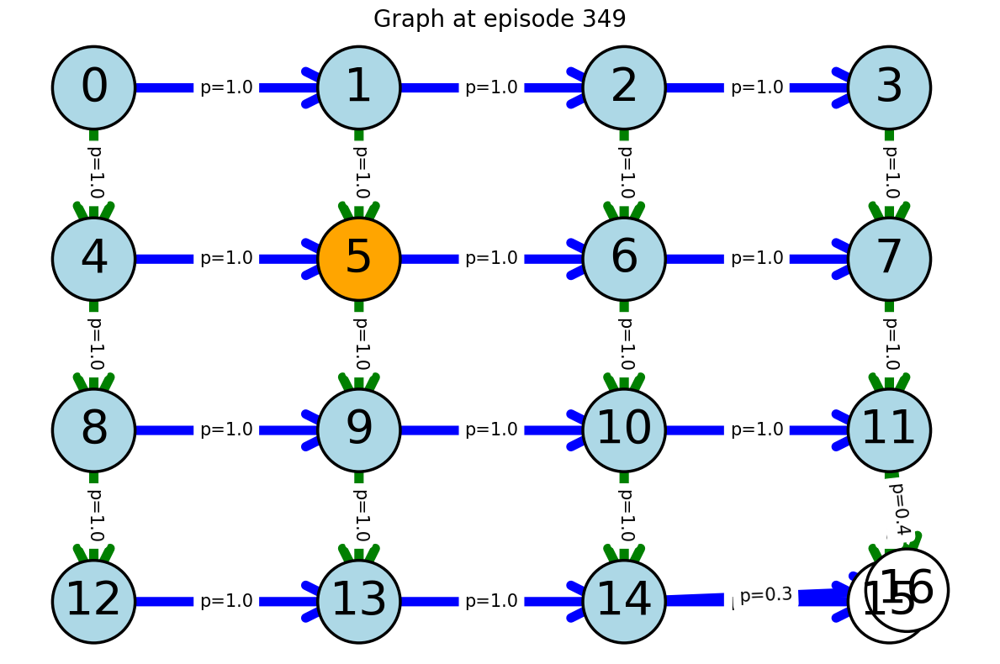

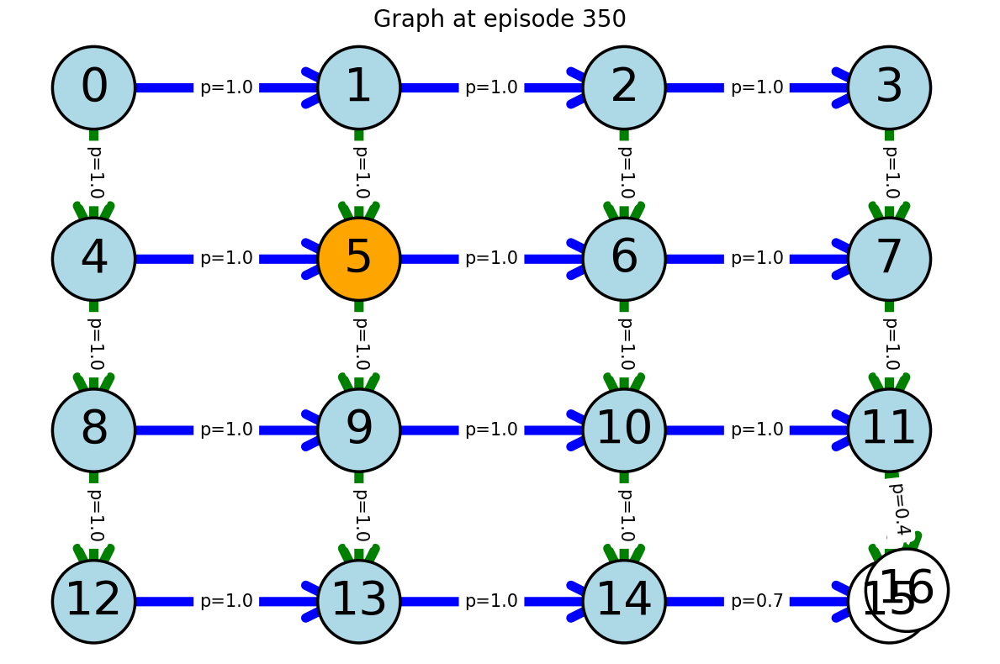

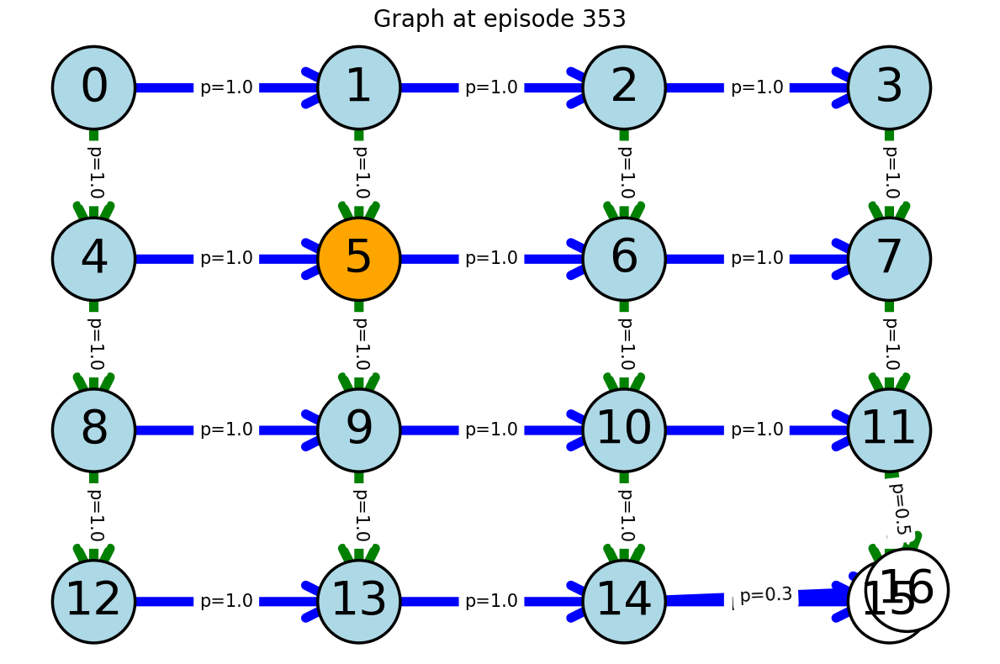

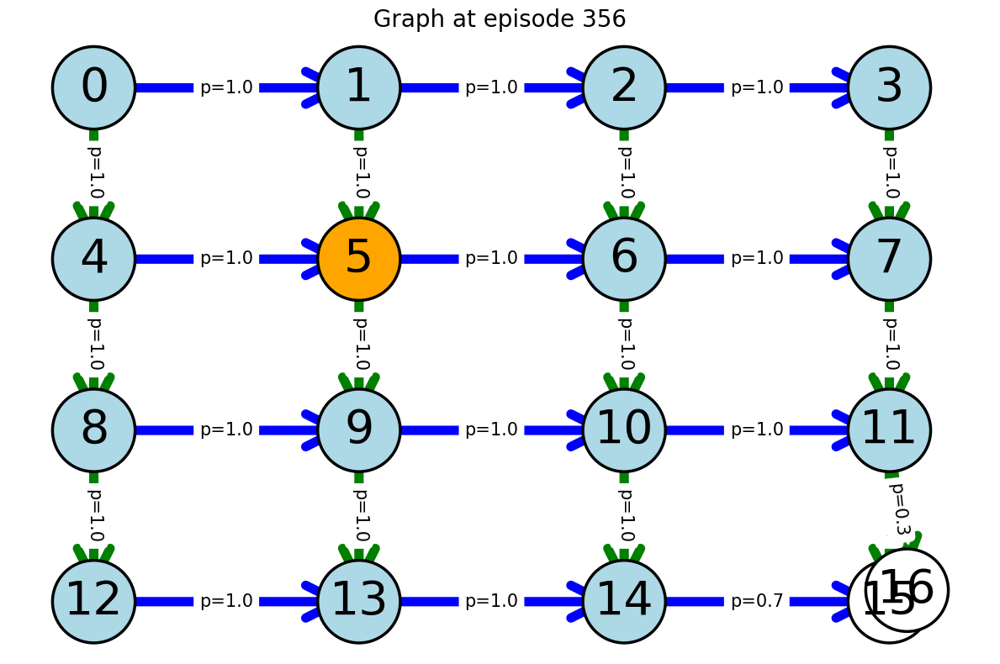

...

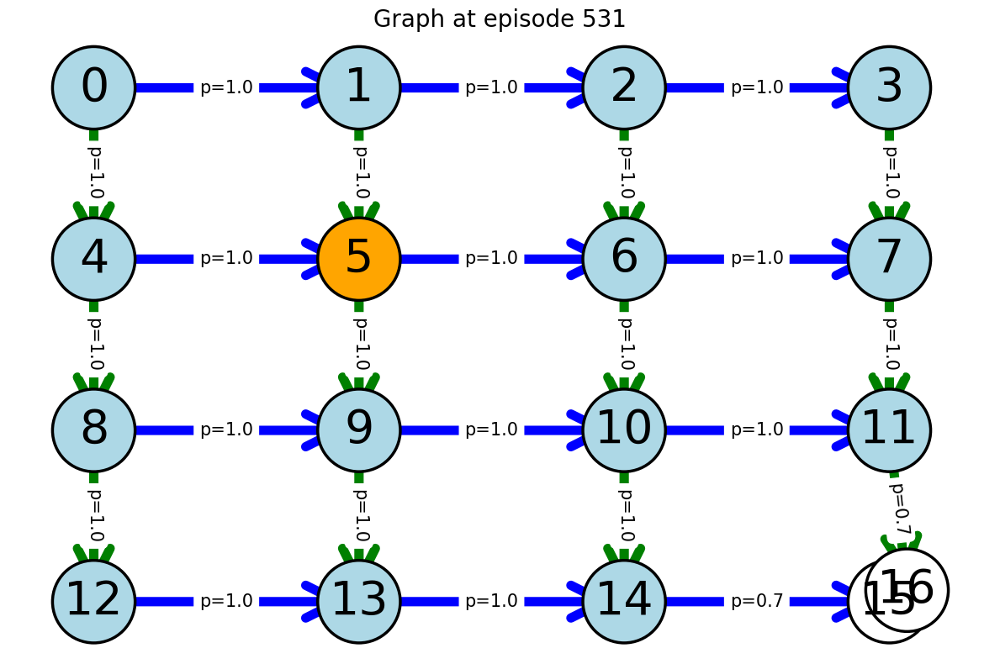

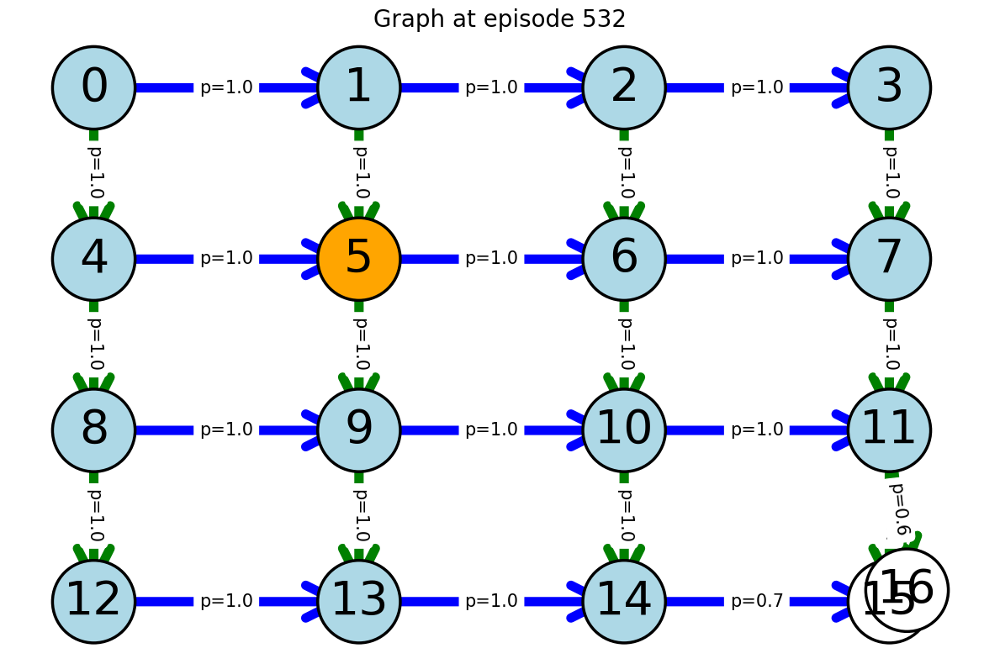

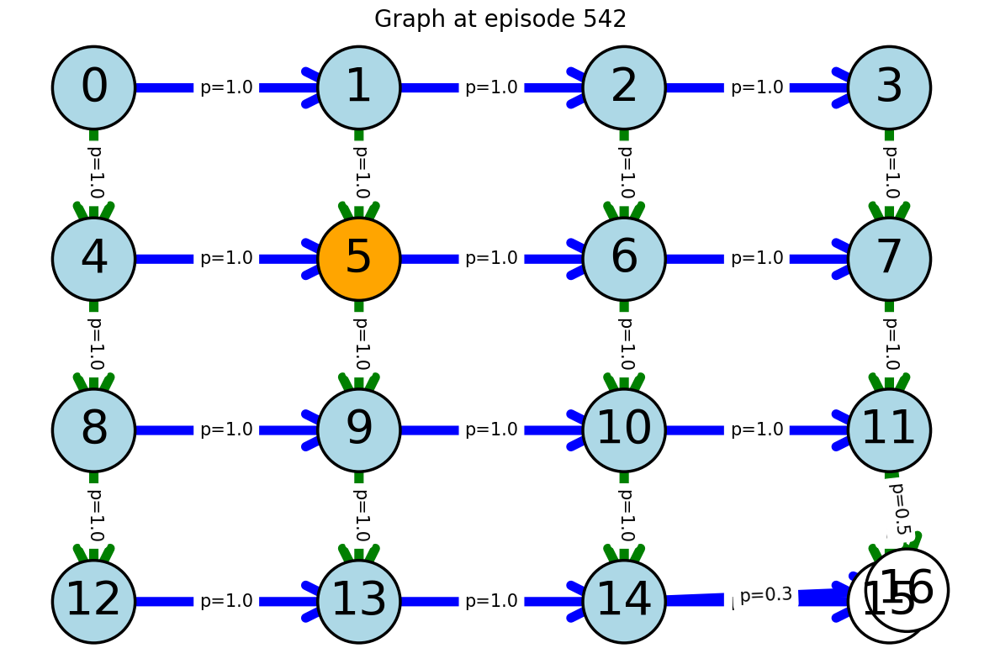

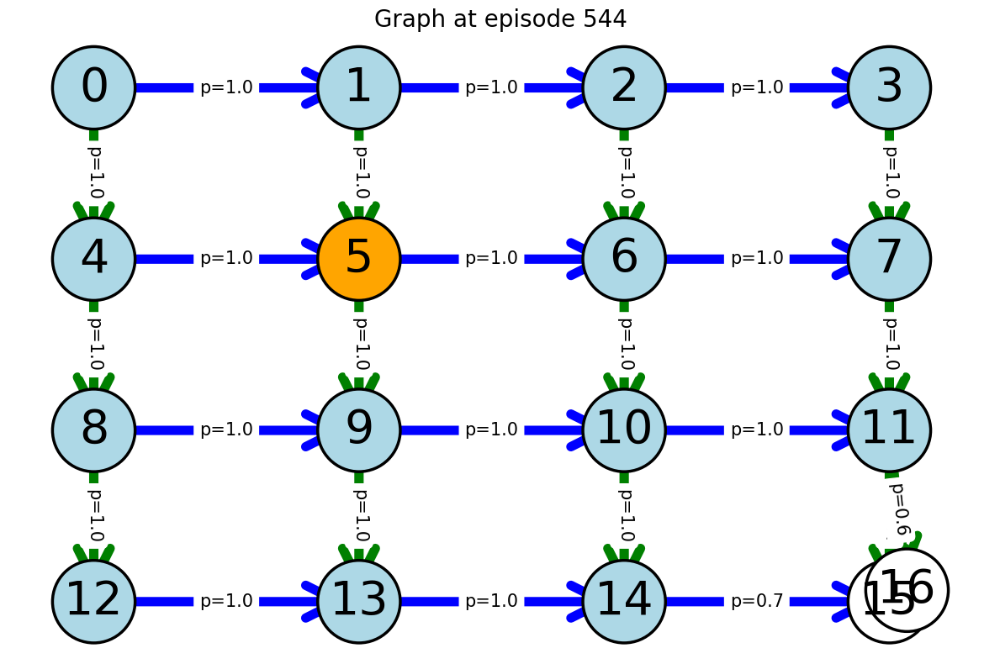

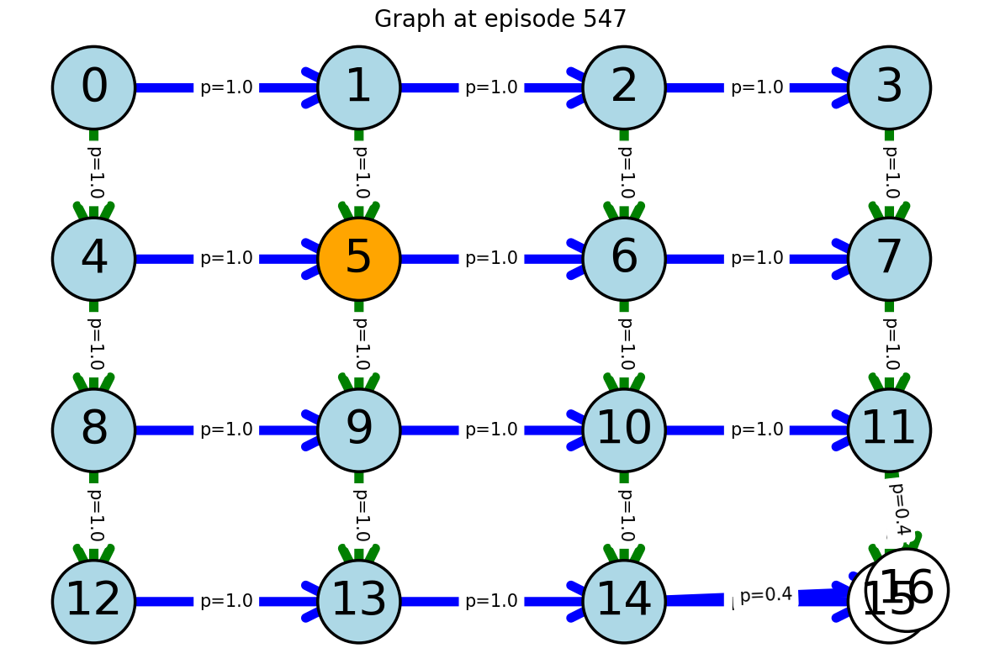

Saved extinction snapshots at episodes: [348, 349, 350, 353, 356, 357, 364, 365, 368, 369, 375, 379, 387, 394, 404, 406, 417, 422, 423, 429] ... total: 48
PNG files saved in the working directory with prefixes acq_seed{PLOT_SEED}_ep* and ext_seed{PLOT_SEED}_ep*


In [22]:

# Extinction with wash-in, change-aware snapshots
env2_snap = GridEnvRightDownNoCue(cue_states=[CUE], env_size=(4,4), rewarded_terminal=[15])
env2_snap.clone_dict = dict(getattr(env_snap, "clone_dict", {}))
env2_snap.reverse_clone_dict = dict(getattr(env_snap, "reverse_clone_dict", {}))
agent_snap.env = env2_snap

# Wash-in overrides (same as earlier)
orig = dict(count_decay=agent_snap.cfg.count_decay, trace_decay=agent_snap.cfg.trace_decay, retro_decay=agent_snap.cfg.retro_decay,
            theta_merge=agent_snap.cfg.theta_merge, confidence=agent_snap.cfg.confidence,
            min_presence_episodes=agent_snap.cfg.min_presence_episodes, min_effective_exposure=agent_snap.cfg.min_effective_exposure)
agent_snap.cfg.count_decay=0.98; agent_snap.cfg.trace_decay=0.98; agent_snap.cfg.retro_decay=0.98
agent_snap.cfg.theta_merge=0.60; agent_snap.cfg.confidence=0.99
agent_snap.cfg.min_presence_episodes += 3; agent_snap.cfg.min_effective_exposure = int(agent_snap.cfg.min_effective_exposure*1.5)

changed_ext = []
for k, ep in enumerate(range(N_ACQ+1, N_ACQ+N_EXT+1)):
    (states, actions) = generate_dataset_post_augmentation(env2_snap, agent_snap.get_T(), n_episodes=1, max_steps=MAX_STEPS)[0]
    agent_snap.update_with_episode(states, actions)
    agent_snap._edge_eps_override = EDGE_EPS_EARLY if k < WASH_IN else EDGE_EPS_LATE
    agent_snap.maybe_merge()

    T_curr = agent_snap.get_T().copy()
    map_curr = clone_dict_tuple(getattr(env2_snap, "clone_dict", {}))

    if graph_changed(prev_T, prev_map, T_curr, map_curr, thr=THRESH):
        T_vis = make_terminals_absorbing_for_plot(T_curr, env2_snap.rewarded_terminals + env2_snap.unrewarded_terminals)
        sanitize_for_plot(env2_snap, T_vis)
        env2_snap.plot_graph(T_vis, niter=ep, threshold=THRESH, save=True, savename=f"ext_seed{PLOT_SEED}_ep{ep}.png")
        changed_ext.append(ep)
        prev_T, prev_map = T_curr, map_curr

    if k == WASH_IN-1:
        agent_snap.cfg.count_decay = orig["count_decay"]; agent_snap.cfg.trace_decay = orig["trace_decay"]; agent_snap.cfg.retro_decay = orig["retro_decay"]
        agent_snap.cfg.theta_merge = orig["theta_merge"]; agent_snap.cfg.confidence = orig["confidence"]
        agent_snap.cfg.min_presence_episodes = orig["min_presence_episodes"]; agent_snap.cfg.min_effective_exposure = orig["min_effective_exposure"]

print("Saved extinction snapshots at episodes:", changed_ext[:20], "... total:", len(changed_ext))
print("PNG files saved in the working directory with prefixes acq_seed{PLOT_SEED}_ep* and ext_seed{PLOT_SEED}_ep*")
